In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
np.set_printoptions(threshold=np.inf)

from autoviz.AutoViz_Class import AutoViz_Class
%matplotlib inline

import geopandas as gpd
import geoplot
import fiona
import json

Imported v0.1.58. After importing, execute '%matplotlib inline' to display charts in Jupyter.
    AV = AutoViz_Class()
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Update: verbose=0 displays charts in your local Jupyter notebook.
        verbose=1 additionally provides EDA data cleaning suggestions. It also displays charts.
        verbose=2 does not display charts but saves them in AutoViz_Plots folder in local machine.
        chart_format='bokeh' displays charts in your local Jupyter notebook.
        chart_format='server' displays charts in your browser: one tab for each chart type
        chart_format='html' silently saves interactive HTML files in your local machine


In [2]:
car_data = pd.read_csv("car-assignments.csv")
car_data = car_data.astype({'CarID': 'float', 'CurrentEmploymentType':'category', 'CurrentEmploymentTitle':'category'})
car_data.info()
car_data.head(8)
car_data.to_pickle('car_df.pkl')
car_data.to_csv('car_df.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44 entries, 0 to 43
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   LastName                44 non-null     object  
 1   FirstName               44 non-null     object  
 2   CarID                   35 non-null     float64 
 3   CurrentEmploymentType   44 non-null     category
 4   CurrentEmploymentTitle  44 non-null     category
dtypes: category(2), float64(1), object(2)
memory usage: 2.2+ KB


In [3]:
credit_data = pd.read_csv("cc_data.csv", encoding='cp1252')
credit_data = credit_data.astype({'location':'category'})
credit_data['timestamp'] = pd.to_datetime(credit_data['timestamp'], infer_datetime_format=True)
credit_data.info()
credit_data.head(8)
credit_data.to_pickle('credit_df.pkl')
credit_data.to_csv('credit_df.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1491 entries, 0 to 1490
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  1491 non-null   datetime64[ns]
 1   location   1491 non-null   category      
 2   price      1491 non-null   float64       
 3   FirstName  1491 non-null   object        
 4   LastName   1491 non-null   object        
dtypes: category(1), datetime64[ns](1), float64(1), object(2)
memory usage: 49.5+ KB


In [4]:
loyalty_data = pd.read_csv("loyalty_data.csv", encoding='cp1252')
loyalty_data['timestamp'] = pd.to_datetime(loyalty_data['timestamp'], infer_datetime_format=True)
loyalty_data = loyalty_data.astype({'location': 'category'})
loyalty_data.info()
loyalty_data.head(8)
loyalty_data.to_pickle('loyalty_df.pkl')
loyalty_data.to_csv('loyalty_df.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1393 entries, 0 to 1392
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  1393 non-null   datetime64[ns]
 1   location   1393 non-null   category      
 2   price      1393 non-null   float64       
 3   FirstName  1393 non-null   object        
 4   LastName   1393 non-null   object        
dtypes: category(1), datetime64[ns](1), float64(1), object(2)
memory usage: 46.3+ KB


In [5]:
gps_data = pd.read_csv("gps.csv", encoding='cp1252')
gps_data['Timestamp'] = pd.to_datetime(gps_data['Timestamp'], infer_datetime_format=True)
gps_data = gps_data.astype({'id': 'float'})
# gps_data = gps_data.astype({'id': 'category'})
gps_data.rename(columns={'id':'CarID'}, inplace=True)
gps_data.info()
gps_data.head(8)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 685169 entries, 0 to 685168
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype         
---  ------     --------------   -----         
 0   Timestamp  685169 non-null  datetime64[ns]
 1   CarID      685169 non-null  float64       
 2   lat        685169 non-null  float64       
 3   long       685169 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 20.9 MB


,Timestamp,CarID,lat,long
0,2014-01-06 06:28:01,35.0,36.076225,24.874689
1,2014-01-06 06:28:01,35.0,36.076220,24.874596
2,2014-01-06 06:28:03,35.0,36.076211,24.874443
3,2014-01-06 06:28:05,35.0,36.076217,24.874253
4,2014-01-06 06:28:06,35.0,36.076214,24.874167
5,2014-01-06 06:28:07,35.0,36.076191,24.874056
6,2014-01-06 06:28:09,35.0,36.076194,24.873906
7,2014-01-06 06:28:10,35.0,36.076183,24.873814


In [6]:
car_df = pd.read_pickle('car_df.pkl')
credit_df = pd.read_pickle('credit_df.pkl')
loyalty_df = pd.read_pickle('loyalty_df.pkl')

In [7]:
car_df.shape

(44, 5)

In [8]:
gps_data.shape

(685169, 4)

In [9]:
gps_data.reset_index()
car_df.reset_index()
car_gps_df = pd.merge(gps_data, car_df, left_on='CarID', right_on='CarID', how='left')
print(car_df[car_df['CarID'] == 35.0])
car_gps_df.head()

      LastName FirstName  CarID CurrentEmploymentType  \
34  Vasco-Pais    Willem   35.0             Executive   

          CurrentEmploymentTitle  
34  Environmental Safety Advisor  


,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle
0,2014-01-06 06:28:01,35.0,36.076225,24.874689,Vasco-Pais,Willem,Executive,Environmental Safety Advisor
1,2014-01-06 06:28:01,35.0,36.076220,24.874596,Vasco-Pais,Willem,Executive,Environmental Safety Advisor
2,2014-01-06 06:28:03,35.0,36.076211,24.874443,Vasco-Pais,Willem,Executive,Environmental Safety Advisor
3,2014-01-06 06:28:05,35.0,36.076217,24.874253,Vasco-Pais,Willem,Executive,Environmental Safety Advisor
4,2014-01-06 06:28:06,35.0,36.076214,24.874167,Vasco-Pais,Willem,Executive,Environmental Safety Advisor


In [10]:
car_gps_df.to_pickle('gps_df.pkl')
car_gps_df.to_csv('gps_df.csv')

In [11]:
# AV = AutoViz_Class()
# AV.AutoViz("gps_df.csv")

In [12]:
# AV.AutoViz("credit_df.csv")

In [13]:
# AV.AutoViz("loyalty_df.csv")

## Prompt 1: Describe common daily routines for GAStech employees.
What does a day in the life of a typical GAStech employee look like?

In [14]:
car_gps_df['fullName'] = car_gps_df['FirstName'] + " " + car_gps_df['LastName']
car_gps_df.head()

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,fullName
0,2014-01-06 06:28:01,35.0,36.076225,24.874689,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais
1,2014-01-06 06:28:01,35.0,36.076220,24.874596,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais
2,2014-01-06 06:28:03,35.0,36.076211,24.874443,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais
3,2014-01-06 06:28:05,35.0,36.076217,24.874253,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais
4,2014-01-06 06:28:06,35.0,36.076214,24.874167,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais


In [15]:
car_gps_df['Date'] = car_gps_df['Timestamp'].map(lambda x: x.date())
car_gps_df.sort_values(by=['Timestamp', 'CarID'], inplace=True)
car_gps_df.head()

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,fullName,Date
0,2014-01-06 06:28:01,35.0,36.076225,24.874689,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais,2014-01-06
1,2014-01-06 06:28:01,35.0,36.076220,24.874596,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais,2014-01-06
2,2014-01-06 06:28:03,35.0,36.076211,24.874443,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais,2014-01-06
3,2014-01-06 06:28:05,35.0,36.076217,24.874253,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais,2014-01-06
4,2014-01-06 06:28:06,35.0,36.076214,24.874167,Vasco-Pais,Willem,Executive,Environmental Safety Advisor,Willem Vasco-Pais,2014-01-06


In [16]:
car_gps_df[car_gps_df['FirstName'].isna()]['CarID'].unique()

array([101., 107., 104., 105., 106.])

In [17]:
abila = fiona.open('Geospatial/Abila.shp')

abila_df = pd.DataFrame(list(abila))

abila_df['singles'] = abila_df['geometry'].apply(lambda x: True if len(x['coordinates']) == 1 else False)
abila_df['singles'].value_counts()
abila_geo = abila_df[abila_df['singles'] == False]
abila_geo.drop(columns=['singles'], inplace=True)
# abila_geo['geometry'] = abila_geo['geometry'].apply(lambda x: {'type': x['type'], 'coordinates': [(x['coordinates'][0][1], x['coordinates'][0][0]), (x['coordinates'][1][1], x['coordinates'][1][0])]})
# abila_geo.columns

abila_json = json.loads(abila_geo.to_json(orient='records'))
abila_gdf = gpd.GeoDataFrame.from_features(abila_json)

In [18]:
img = plt.imread('map-tourist.jpg')

In [19]:
abila_pois = abila_df[abila_df['singles'] == True]
abila_pois.drop(columns=['singles'], inplace=True)
# abila_pois.head()
abila_pois['geometry'] = abila_pois['geometry'].apply(lambda x: {'type': 'Point', 'coordinates': (x['coordinates'][0][0], x['coordinates'][0][1])})
pois_json = json.loads(abila_pois.to_json(orient='records'))
pois_gdf = gpd.GeoDataFrame.from_features(pois_json)
pois_gdf.head()

,geometry,TLID,FEDIRP,FENAME,FETYPE,FEDIRS,FRADDL,TOADDL,FRADDR,TOADDR
0,POINT (24.83764 36.04550),184619449,S,Wenna,St,None,1040.0,1026.0,1199.0,1025.0
1,POINT (24.82416 36.06032),184643056,N,Opalante,Dr,None,1500.0,1698.0,1501.0,1699.0
2,POINT (24.82426 36.05852),184643071,N,Alamanas,St,None,7400.0,7498.0,7401.0,7499.0
3,POINT (24.82436 36.05662),184643075,N,Agiasou,St,None,7400.0,7498.0,7401.0,7499.0
4,POINT (24.82596 36.05042),184643279,None,Egeou,Ave,None,7300.0,7498.0,7301.0,7499.0


In [20]:
# fig, ax = plt.subplots(figsize=(10,10))
# ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
# abila_gdf.plot(ax=ax, alpha=0.5)
# pois_gdf.plot(ax=ax, color='yellow')
# plt.show()

In [21]:
car_gps_df["CarID"] = car_gps_df["CarID"].astype(str)
car_gps_df.dtypes

Timestamp                 datetime64[ns]
CarID                             object
lat                              float64
long                             float64
LastName                          object
FirstName                         object
CurrentEmploymentType           category
CurrentEmploymentTitle          category
fullName                          object
Date                              object
dtype: object

In [22]:
# dates = car_gps_df['Date'].unique()
# for i in range(len(dates)):
#     ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
#     ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
#     sns.lineplot(x=car_gps_df[car_gps_df['Date'] == pd.to_datetime(dates[i])]['long'], y=car_gps_df[car_gps_df['Date'] == pd.to_datetime(dates[i])]['lat'], hue=car_gps_df[car_gps_df['Date'] == pd.to_datetime(dates[i])]['CarID'], palette='inferno', sort=False, alpha=0.6, ax=ax)
#     plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='CarID')
#     plt.title("Car Routes on " + str(dates[i]))
#     plt.show()

In [153]:
# unmarked = car_gps_df[car_gps_df['FirstName'].isna()]
# unmarked.sort_values(by='Timestamp', inplace=True)
# dates = unmarked['Date'].unique()
# for i in range(len(dates)):
#     ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
#     ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
#     sns.lineplot(x=unmarked[unmarked['Date'] == pd.to_datetime(dates[i])]['long'], y=unmarked[unmarked['Date'] == pd.to_datetime(dates[i])]['lat'], hue=unmarked[unmarked['Date'] == pd.to_datetime(dates[i])]['CarID'], palette='inferno', sort=False, ax=ax)
#     plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='CarID')
#     plt.title("Car Routes on " + str(dates[i]))
#     plt.show()

In [154]:
# emps = car_gps_df[car_gps_df['fullName'].notna()]['fullName'].unique()
# dates = car_gps_df['Date'].unique()
# for emp in emps:
#     emp_dat = car_gps_df[car_gps_df['fullName'] == emp]
#     fig = plt.figure()
#     for i in range(1, 15):
#         ax = fig.add_subplot(2, 7, i)
#         sns.lineplot(x=emp_dat[emp_dat['Date'] == pd.to_datetime(dates[i - 1])]['long'], y=emp_dat[emp_dat['Date'] == pd.to_datetime(dates[i - 1])]['lat'], sort=False, ax=ax)
#         ax.set_title(dates[i - 1])
#     fig.suptitle("Daily Routes for " + emp)
#     plt.show()

In [155]:
# for i in range(len(emps)):
#     ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
#     ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
#     sns.lineplot(x=car_gps_df[car_gps_df['fullName'] == emps[i]]['long'], y=car_gps_df[car_gps_df['fullName'] == emps[i]]['lat'], hue=car_gps_df[car_gps_df['fullName'] == emps[i]]['Date'], palette='inferno', sort=False, alpha=0.6, ax=ax)
#     plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='Date')
#     plt.title("Car Routes of " + emps[i])
#     plt.show()

In [156]:
# for i in range(len(dates)):
#     ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
#     ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
#     sns.lineplot(x=car_gps_df[car_gps_df['Date'] == pd.to_datetime(dates[i])]['long'], y=car_gps_df[car_gps_df['Date'] == pd.to_datetime(dates[i])]['lat'], hue=car_gps_df[car_gps_df['Date'] == pd.to_datetime(dates[i])]['fullName'], palette='inferno', sort=False, alpha=0.6, ax=ax)
#     plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='Full Name')
#     plt.title("Car Routes on " + str(dates[i]))
#     plt.show()

In [29]:
elsa = car_gps_df[car_gps_df['fullName'] == "Elsa Orilla"].copy()
elsa.head()

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,fullName,Date
6660,2014-01-06 07:46:01,28.0,36.069169,24.879566,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06
6661,2014-01-06 07:46:01,28.0,36.073056,24.875129,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06
6669,2014-01-06 07:46:02,28.0,36.073645,24.876000,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06
6675,2014-01-06 07:46:03,28.0,36.072611,24.875700,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06
6684,2014-01-06 07:46:05,28.0,36.072493,24.876119,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06


In [33]:
elsa['lat_avg'] = elsa.lat.rolling(10).median()
elsa['long_avg'] = elsa.long.rolling(10).median()

In [34]:
elsa.head()

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,fullName,Date,lat_avg,long_avg
6660,2014-01-06 07:46:01,28.0,36.069169,24.879566,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06,NaN,NaN
6661,2014-01-06 07:46:01,28.0,36.073056,24.875129,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06,NaN,NaN
6669,2014-01-06 07:46:02,28.0,36.073645,24.876000,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06,NaN,NaN
6675,2014-01-06 07:46:03,28.0,36.072611,24.875700,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06,NaN,NaN
6684,2014-01-06 07:46:05,28.0,36.072493,24.876119,Orilla,Elsa,Engineering,Drill Technician,Elsa Orilla,2014-01-06,NaN,NaN


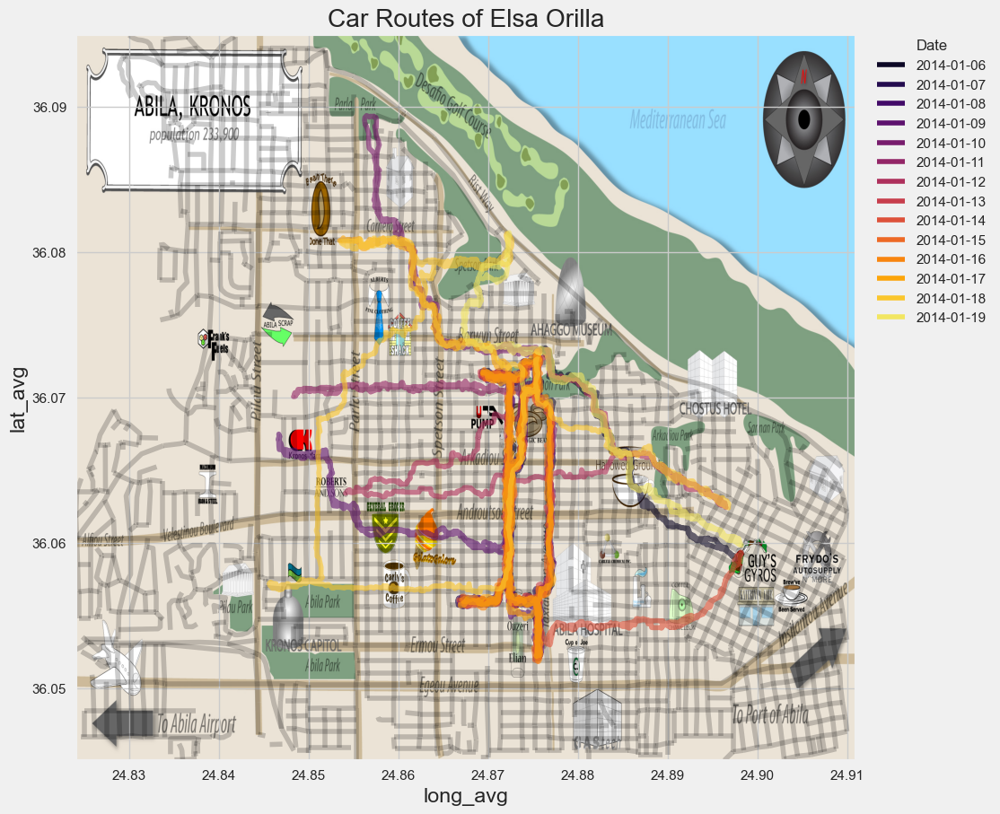

In [35]:
ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
sns.lineplot(x=elsa['long_avg'], y=elsa['lat_avg'], hue=elsa['Date'], palette='inferno', sort=False, alpha=0.6, ax=ax)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='Date')
plt.title("Car Routes of Elsa Orilla")
plt.show()

In [36]:
loyalty_df['fullName'] = loyalty_df['FirstName'] + " " + loyalty_df['LastName']
credit_df['fullName'] = credit_df['FirstName'] + " " + credit_df['LastName']
loyalty_df['date'] = loyalty_df['timestamp'].map(lambda x: x.date())
credit_df['date'] = credit_df['timestamp'].map(lambda x: x.date())

In [37]:
transactions = pd.concat([credit_df, loyalty_df], ignore_index=True)
transactions.sort_values(by=['location', 'timestamp'], inplace=True)
transactions.head(10)

,timestamp,location,price,FirstName,LastName,fullName,date
1823,2014-01-06 00:00:00,Abila Airport,4540.08,Albina,Hafon,Albina Hafon,2014-01-06
1824,2014-01-06 00:00:00,Abila Airport,777.06,Albina,Hafon,Albina Hafon,2014-01-06
1833,2014-01-06 00:00:00,Abila Airport,612.47,Henk,Mies,Henk Mies,2014-01-06
29,2014-01-06 08:23:00,Abila Airport,4540.08,Albina,Hafon,Albina Hafon,2014-01-06
48,2014-01-06 12:16:00,Abila Airport,1873.79,Henk,Mies,Henk Mies,2014-01-06
91,2014-01-06 15:14:00,Abila Airport,777.06,Albina,Hafon,Albina Hafon,2014-01-06
92,2014-01-06 15:39:00,Abila Airport,612.47,Henk,Mies,Henk Mies,2014-01-06
1914,2014-01-07 00:00:00,Abila Airport,3840.37,Benito,Hawelon,Benito Hawelon,2014-01-07
1920,2014-01-07 00:00:00,Abila Airport,124.89,Henk,Mies,Henk Mies,2014-01-07
1921,2014-01-07 00:00:00,Abila Airport,3411.29,Henk,Mies,Henk Mies,2014-01-07


In [38]:
transactions.shape

(2884, 7)

In [39]:
transactions.drop_duplicates(subset=['location', 'price', 'fullName', 'date'], inplace=True)
transactions.shape

(1818, 7)

In [40]:
transactions.head(10)

,timestamp,location,price,FirstName,LastName,fullName,date
1823,2014-01-06 00:00:00,Abila Airport,4540.08,Albina,Hafon,Albina Hafon,2014-01-06
1824,2014-01-06 00:00:00,Abila Airport,777.06,Albina,Hafon,Albina Hafon,2014-01-06
1833,2014-01-06 00:00:00,Abila Airport,612.47,Henk,Mies,Henk Mies,2014-01-06
48,2014-01-06 12:16:00,Abila Airport,1873.79,Henk,Mies,Henk Mies,2014-01-06
1914,2014-01-07 00:00:00,Abila Airport,3840.37,Benito,Hawelon,Benito Hawelon,2014-01-07
1920,2014-01-07 00:00:00,Abila Airport,124.89,Henk,Mies,Henk Mies,2014-01-07
1921,2014-01-07 00:00:00,Abila Airport,3411.29,Henk,Mies,Henk Mies,2014-01-07
1952,2014-01-07 00:00:00,Abila Airport,1641.96,Dylan,Scozzese,Dylan Scozzese,2014-01-07
2017,2014-01-08 00:00:00,Abila Airport,2723.18,Henk,Mies,Henk Mies,2014-01-08
2018,2014-01-08 00:00:00,Abila Airport,2769.12,Henk,Mies,Henk Mies,2014-01-08


In [41]:
grouped_transactions = transactions.groupby(by=['location', 'date', 'fullName'], as_index=False)['price'].sum()
grouped_transactions = grouped_transactions[grouped_transactions['price'] > 0.0]
grouped_transactions.head()

,location,date,fullName,price
0,Abila Airport,2014-01-06,Albina Hafon,5317.14
1,Abila Airport,2014-01-06,Henk Mies,2486.26
2,Abila Airport,2014-01-07,Benito Hawelon,3840.37
3,Abila Airport,2014-01-07,Dylan Scozzese,1641.96
4,Abila Airport,2014-01-07,Henk Mies,3536.18


In [157]:
# stores = grouped_transactions['location'].unique()
# for store in range(len(stores)):
#     store_dat = grouped_transactions[grouped_transactions['location'] == stores[store]]
#     # fig = plt.figure(figsize=(10,8))
#     dates = store_dat['date'].unique()
#     for i in range(len(dates)):
#         # ax = fig.add_subplot(2, 7, i)
#         ax = sns.barplot(x=store_dat[store_dat['date'] == pd.to_datetime(dates[i - 1])]['fullName'], y=store_dat[store_dat['date'] == pd.to_datetime(dates[i - 1])]['price'])
#         ax.bar_label(ax.containers[0])
#         plt.title("Spend per Employee at " + stores[store] + " on " + str(dates[i - 1]))
#         plt.xticks(rotation=45)
#         plt.show()

In [55]:
car_df['fullName'] = car_df['FirstName'] + " " + car_df['LastName']
emp_titles = car_df[['fullName', 'CurrentEmploymentType', 'CurrentEmploymentTitle']].drop_duplicates().copy()
emp_titles.head()

,fullName,CurrentEmploymentType,CurrentEmploymentTitle
0,Lucas Alcazar,Information Technology,IT Helpdesk
1,Lars Azada,Engineering,Engineer
2,Felix Balas,Engineering,Engineer
3,Ingrid Barranco,Executive,SVP/CFO
4,Isak Baza,Information Technology,IT Technician


In [56]:
totals = transactions.groupby(by='fullName', as_index=False).sum().sort_values(by='price', ascending=False)
totals.head()

,fullName,price
49,Valeria Morlun,51522.83
22,Henk Mies,44107.97
11,Cecilia Morluniau,42517.18
15,Dylan Scozzese,34296.59
27,Irene Nant,32387.95


In [58]:
spend = totals.merge(emp_titles, how='inner', on='fullName').sort_values(by='price', ascending=False)
spend

,fullName,price,CurrentEmploymentType,CurrentEmploymentTitle
0,Valeria Morlun,51522.83,Facilities,Truck Driver
1,Henk Mies,44107.97,Facilities,Truck Driver
2,Cecilia Morluniau,42517.18,Facilities,Truck Driver
3,Dylan Scozzese,34296.59,Facilities,Truck Driver
4,Irene Nant,32387.95,Facilities,Truck Driver
5,Albina Hafon,24186.94,Facilities,Truck Driver
6,Benito Hawelon,24023.33,Facilities,Truck Driver
7,Adan Morlun,17185.95,Facilities,Truck Driver
8,Claudio Hawelon,13028.12,Facilities,Truck Driver
9,Lucas Alcazar,11913.34,Information Technology,IT Helpdesk


In [59]:
car_gps_df[['lat','long']] = round(car_gps_df[['lat','long']], 3)
pois = car_gps_df.groupby(by=['Timestamp', 'lat','long'], as_index=False)['fullName'].count()
pois.sort_values(by='fullName', ascending=False, inplace=True)
# pois = pois[pois['fullName'] > 1]
points = pois.drop_duplicates(subset=['lat', 'long'])
points

,Timestamp,lat,long,fullName
609527,2014-01-17 17:12:01,36.048,24.880,14
609564,2014-01-17 17:12:14,36.049,24.880,7
171470,2014-01-09 08:02:01,36.054,24.901,5
609591,2014-01-17 17:12:22,36.050,24.880,5
609621,2014-01-17 17:12:31,36.051,24.880,5
...,...,...,...,...
80486,2014-01-07 13:09:15,36.054,24.842,0
80429,2014-01-07 13:08:04,36.051,24.846,0
80432,2014-01-07 13:08:09,36.051,24.845,0
80435,2014-01-07 13:08:16,36.052,24.845,0


In [60]:
points['time'] = ""
points['time'][points['Timestamp'].apply(lambda x: x.hour) <= pd.to_datetime('7:00').hour] = 'Morning'
points['time'][points['Timestamp'].apply(lambda x: x.hour) > pd.to_datetime('7:00').hour] = 'Working'
points['time'][points['Timestamp'].apply(lambda x: x.hour) >= pd.to_datetime('17:00').hour] = 'Evening'
points['time'][points['Timestamp'].apply(lambda x: x.date()).isin([pd.to_datetime('2014-01-19'), pd.to_datetime('2014-01-18'), pd.to_datetime('2014-01-12'), pd.to_datetime('2014-01-11')])] = 'Weekend'
points['time'].value_counts()

Working    653
Evening    439
Weekend    355
Morning    156
Name: time, dtype: int64

In [61]:
points = points[points['time'] != 'Working']

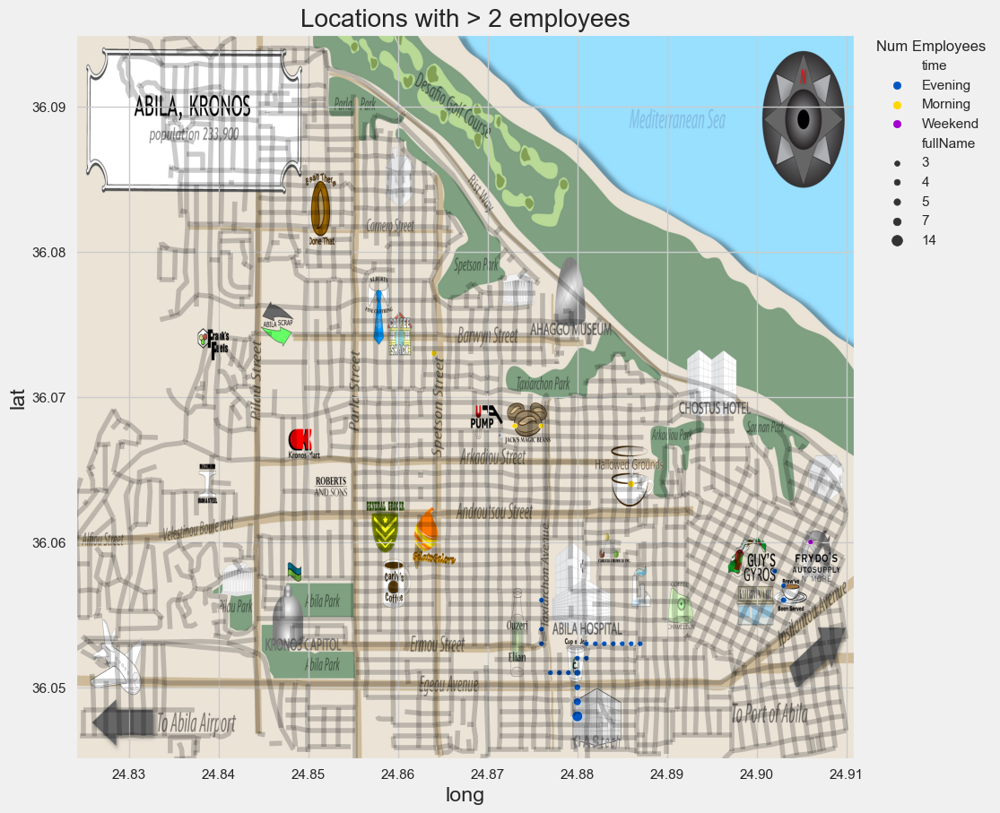

In [62]:
ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
sns.scatterplot(data=points[points['fullName'] > 2], x='long', y='lat', size='fullName', hue='time', palette='prism')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='Num Employees')
plt.title("Locations with > 2 employees")
plt.show()

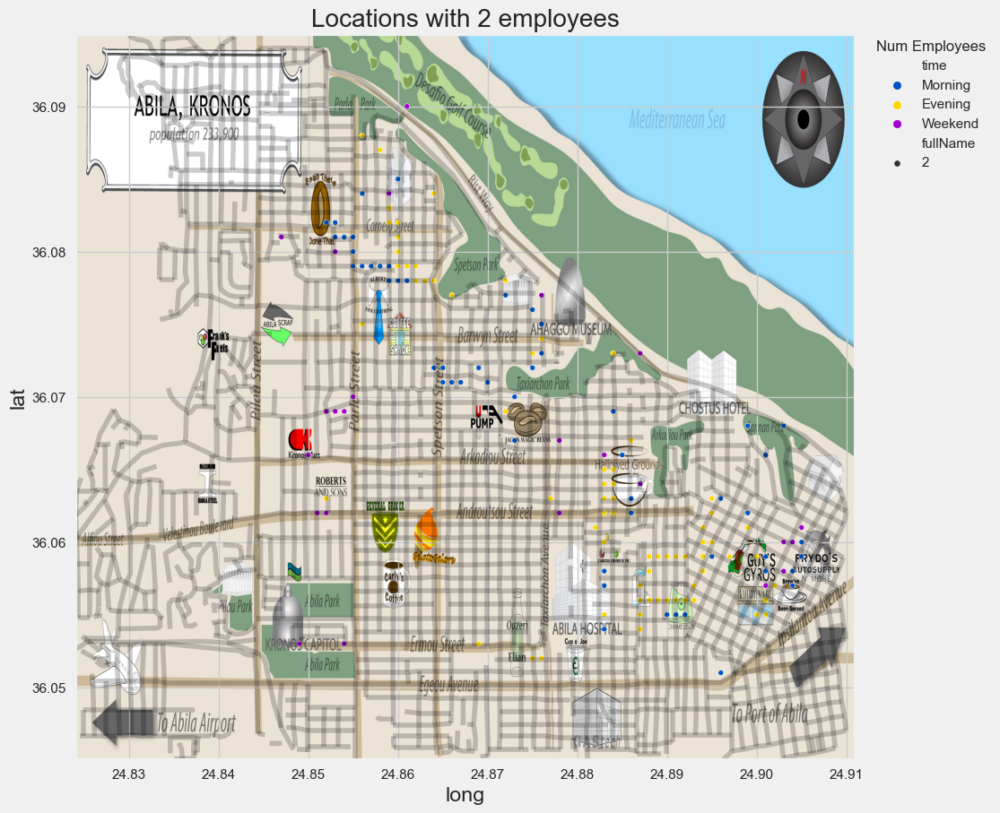

In [63]:
ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
sns.scatterplot(data=points[points['fullName'] == 2], x='long', y='lat', size='fullName', hue='time', palette='prism')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='Num Employees')
plt.title("Locations with 2 employees")
plt.show()

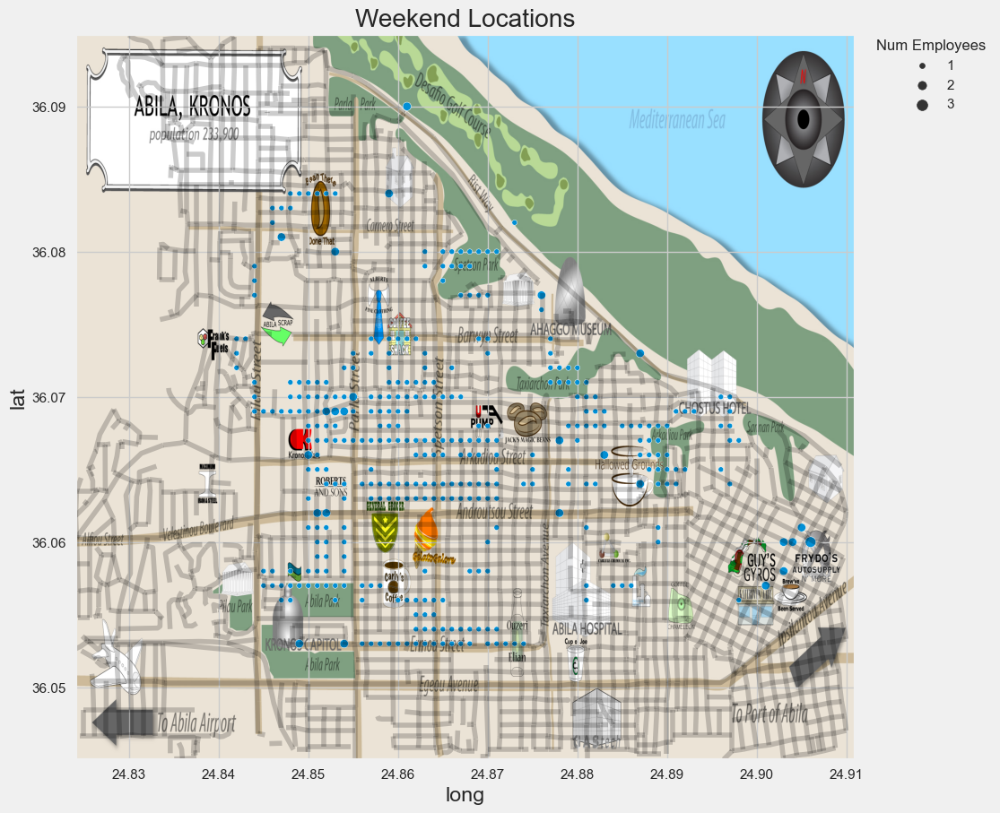

In [64]:
weekend = points[points['time'] == 'Weekend']
ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
sns.scatterplot(data=weekend, x='long', y='lat', size='fullName', palette='prism')
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='Num Employees')
plt.title("Weekend Locations")
plt.show()

In [65]:
groups = transactions.groupby(by=['timestamp', 'location'], as_index=False)['fullName'].count()
groups.sort_values(by='fullName', ascending=False, inplace=True)
groups = groups[groups['fullName'] > 1]
groups

,timestamp,location,fullName
308,2014-01-11,Katerina’s Café,19
549,2014-01-16,Katerina’s Café,18
125,2014-01-08,Brew've Been Served,17
4,2014-01-06,Brew've Been Served,17
430,2014-01-14,Katerina’s Café,17
...,...,...,...
420,2014-01-14,Chostus Hotel,2
415,2014-01-14,Albert's Fine Clothing,2
127,2014-01-08,Carlyle Chemical Inc.,2
593,2014-01-17,Chostus Hotel,2


<AxesSubplot:xlabel='long', ylabel='lat'>

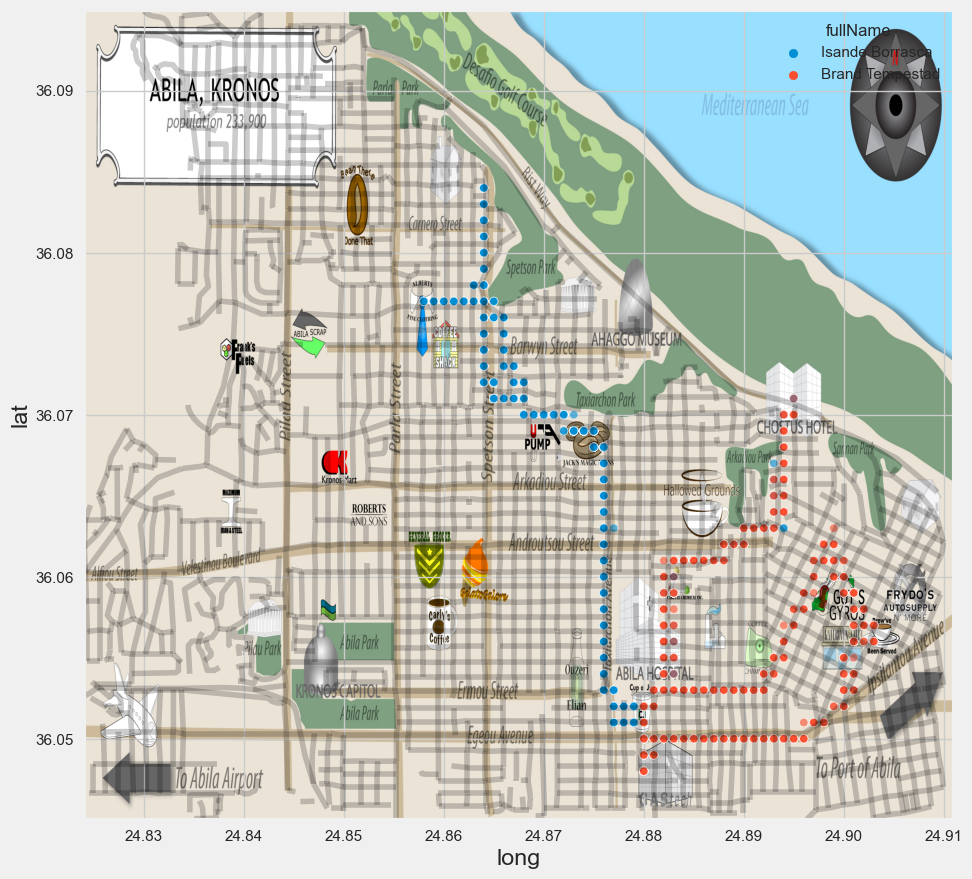

In [112]:
sub = car_gps_df[car_gps_df['fullName'].isin(['Brand Tempestad', 'Isande Borrasca'])]
ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
sns.scatterplot(x=sub[sub['Date'] == pd.to_datetime("2014-01-17 00:00:00")]['long'], y=sub[sub['Date'] == pd.to_datetime("2014-01-17 00:00:00")]['lat'], hue=sub['fullName'], ax=ax, alpha=0.6)


<AxesSubplot:xlabel='long', ylabel='lat'>

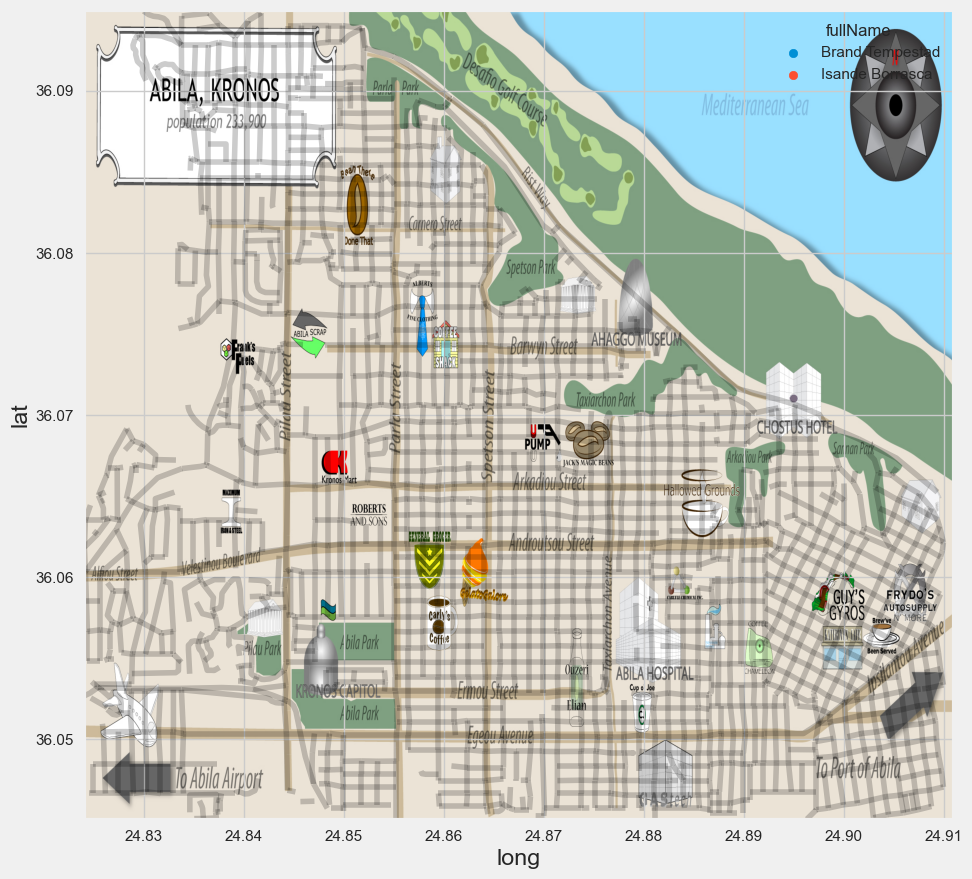

In [119]:
sub = sub[(sub['lat'] > 36.07) & (sub['long'] > 24.894)].sort_values(by='Timestamp', ascending=False)
ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
sns.scatterplot(x=sub['long'], y=sub['lat'], hue=sub['fullName'], ax=ax, alpha=0.2)

In [158]:
# hotel = car_gps_df[(car_gps_df['lat'] > 36.07) & (car_gps_df['long'] > 24.894)].sort_values(by='Timestamp')
# dates = hotel['Date'].unique()
# for i in range(len(dates)):
#     ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
#     ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
#     sns.scatterplot(x=hotel[hotel['Date'] == pd.to_datetime(dates[i])]['long'], y=hotel[hotel['Date'] == pd.to_datetime(dates[i])]['lat'], hue=hotel[hotel['Date'] == pd.to_datetime(dates[i])]['fullName'], ax=ax, alpha=0.2)
#     plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, title='Full Name')
#     plt.title("Employees at the hotel on " + str(dates[i]))
#     plt.show()


<AxesSubplot:xlabel='long', ylabel='lat'>

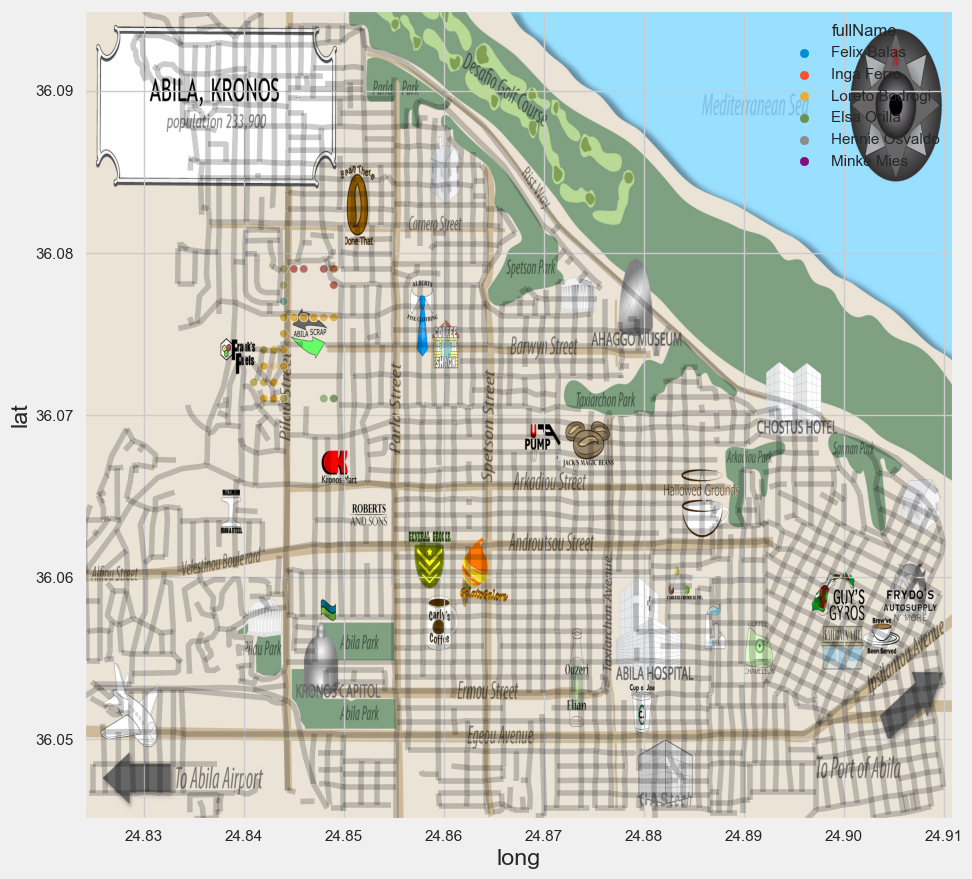

In [126]:
scrap = car_gps_df[(car_gps_df['lat'] > 36.07) & (car_gps_df['lat'] < 36.08) & (car_gps_df['long'] > 24.84) & (car_gps_df['long'] < 24.85)].sort_values(by='Timestamp', ascending=False)
ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
sns.scatterplot(x=scrap['long'], y=scrap['lat'], hue=scrap['fullName'], ax=ax, alpha=0.2)

In [125]:
transactions[transactions['location'] == 'Abila Scrapyard']

,timestamp,location,price,FirstName,LastName,fullName,date
1951,2014-01-07,Abila Scrapyard,2149.28,Dylan,Scozzese,Dylan Scozzese,2014-01-07
2138,2014-01-09,Abila Scrapyard,1158.36,Dylan,Scozzese,Dylan Scozzese,2014-01-09
2495,2014-01-14,Abila Scrapyard,4277.40,Dylan,Scozzese,Dylan Scozzese,2014-01-14
2691,2014-01-16,Abila Scrapyard,1897.05,Dylan,Scozzese,Dylan Scozzese,2014-01-16


<AxesSubplot:xlabel='long', ylabel='lat'>

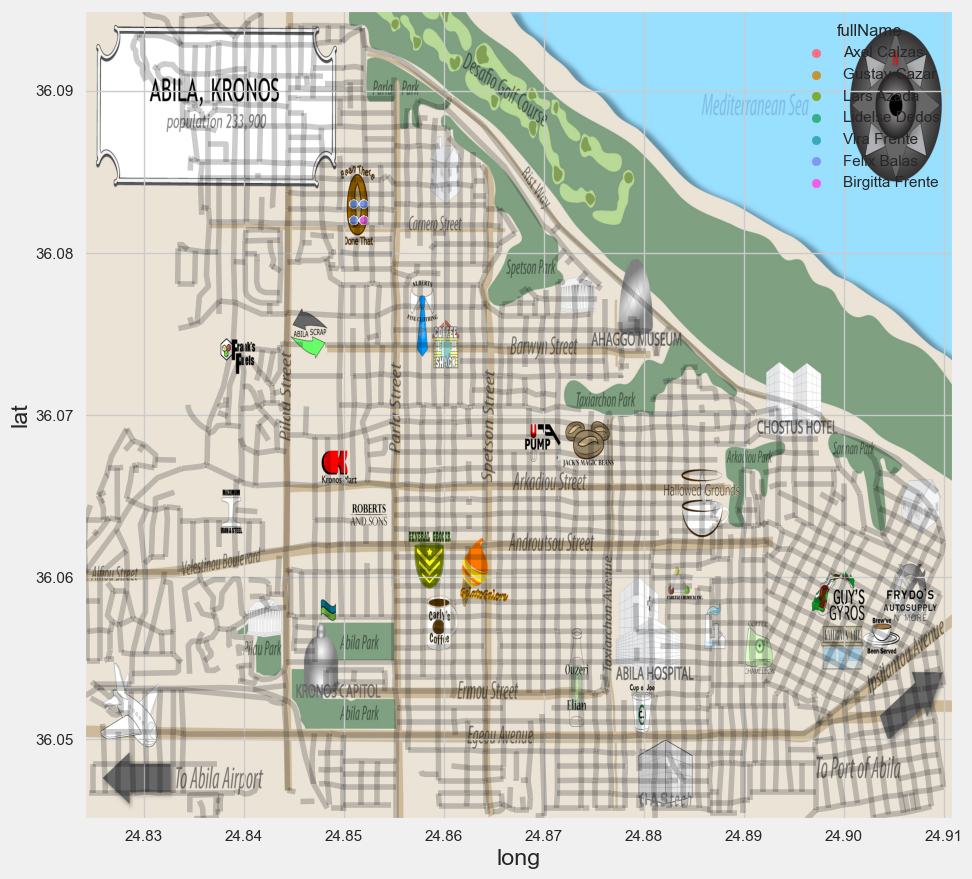

In [129]:
bean = car_gps_df[(car_gps_df['lat'] > 36.08) & (car_gps_df['lat'] < 36.085) & (car_gps_df['long'] > 24.85) & (car_gps_df['long'] < 24.853)].sort_values(by='Timestamp', ascending=False)
ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
sns.scatterplot(x=bean[bean['Date'] == pd.to_datetime('2014-01-13')]['long'], y=bean[bean['Date'] == pd.to_datetime('2014-01-13')]['lat'], hue=bean[bean['Date'] == pd.to_datetime('2014-01-13')]['fullName'], ax=ax, alpha=0.2)

In [131]:
bean[bean['Date'] == pd.to_datetime('2014-01-13')].drop_duplicates(subset='fullName')

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,fullName,Date
344512,2014-01-13 08:21:32,9.0,36.082,24.852,Calzas,Axel,Engineering,Drill Technician,Axel Calzas,2014-01-13
341305,2014-01-13 08:07:31,11.0,36.082,24.852,Cazar,Gustav,Engineering,Hydraulic Technician,Gustav Cazar,2014-01-13
339861,2014-01-13 08:02:29,2.0,36.082,24.852,Azada,Lars,Engineering,Engineer,Lars Azada,2014-01-13
336481,2014-01-13 07:52:31,14.0,36.082,24.852,Dedos,Lidelse,Engineering,Engineering Group Manager,Lidelse Dedos,2014-01-13
335387,2014-01-13 07:49:30,19.0,36.082,24.852,Frente,Vira,Engineering,Hydraulic Technician,Vira Frente,2014-01-13
332484,2014-01-13 07:39:30,3.0,36.082,24.852,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-13
332286,2014-01-13 07:38:30,18.0,36.082,24.852,Frente,Birgitta,Engineering,Geologist,Birgitta Frente,2014-01-13


In [150]:
car_gps_df[(car_gps_df['Timestamp'] > pd.to_datetime('2014-01-13 07:39:30')) & (car_gps_df['fullName'] == 'Felix Balas')].sort_values(by='Timestamp')

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,fullName,Date
332491,2014-01-13 07:39:32,3.0,36.082,24.853,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-13
332512,2014-01-13 07:39:38,3.0,36.082,24.853,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-13
332519,2014-01-13 07:39:40,3.0,36.082,24.853,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-13
332528,2014-01-13 07:39:43,3.0,36.082,24.853,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-13
332540,2014-01-13 07:39:46,3.0,36.082,24.853,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-13
...,...,...,...,...,...,...,...,...,...,...
682865,2014-01-19 19:49:17,3.0,36.086,24.858,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-19
682866,2014-01-19 19:49:18,3.0,36.086,24.858,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-19
682869,2014-01-19 19:49:22,3.0,36.086,24.858,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-19
682871,2014-01-19 19:49:25,3.0,36.087,24.858,Balas,Felix,Engineering,Engineer,Felix Balas,2014-01-19


In [143]:
transactions[(transactions['location'] == "Brew've Been Served") & (transactions['price'] > 90)]

,timestamp,location,price,FirstName,LastName,fullName,date
145,2014-01-07 07:56:00,Brew've Been Served,98.53,Brand,Tempestad,Brand Tempestad,2014-01-07
274,2014-01-08 07:55:00,Brew've Been Served,91.87,Varja,Lagos,Varja Lagos,2014-01-08
400,2014-01-09 07:56:00,Brew've Been Served,98.25,Dante,Coginian,Dante Coginian,2014-01-09
407,2014-01-09 08:01:00,Brew've Been Served,92.12,Varja,Lagos,Varja Lagos,2014-01-09
539,2014-01-10 07:56:00,Brew've Been Served,97.25,Edvard,Vann,Edvard Vann,2014-01-10
540,2014-01-10 07:56:00,Brew've Been Served,90.72,Isia,Vann,Isia Vann,2014-01-10
1152,2014-01-16 08:08:00,Brew've Been Served,90.33,Dante,Coginian,Dante Coginian,2014-01-16


<AxesSubplot:xlabel='long', ylabel='lat'>

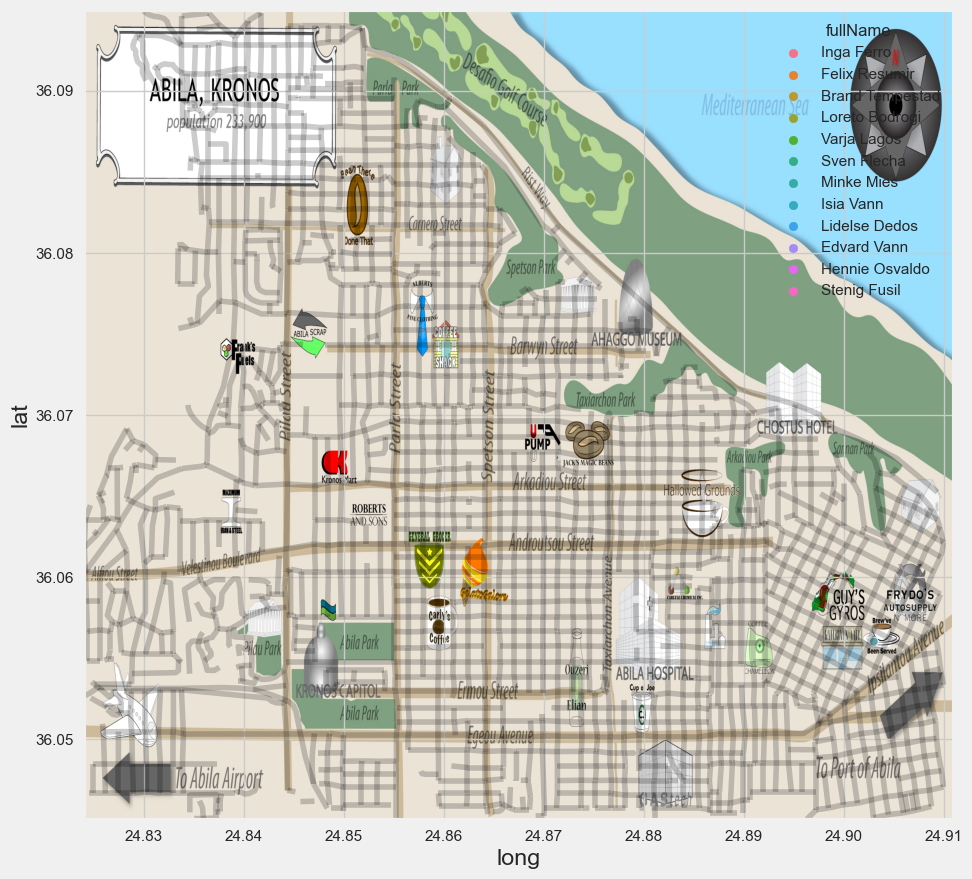

In [151]:
brew = car_gps_df[(car_gps_df['lat'] > 36.054) & (car_gps_df['lat'] < 36.057) & (car_gps_df['long'] > 24.902) & (car_gps_df['long'] < 24.905)].sort_values(by='Timestamp', ascending=False)
ax = abila_gdf.plot(alpha=0.2, color='black', figsize=(10,10))
ax.imshow(img, extent=[24.824, 24.911, 36.045, 36.095], aspect='auto')
sns.scatterplot(x=brew[brew['Date'] == pd.to_datetime('2014-01-08')]['long'], y=brew[brew['Date'] == pd.to_datetime('2014-01-08')]['lat'], hue=brew[brew['Date'] == pd.to_datetime('2014-01-08')]['fullName'], ax=ax, alpha=0.2)

In [152]:
brew[brew['Date'] == pd.to_datetime('2014-01-08')].drop_duplicates(subset='fullName')

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,fullName,Date
163691,2014-01-08 21:03:08,13.0,36.056,24.903,Ferro,Inga,Security,Site Control,Inga Ferro,2014-01-08
163611,2014-01-08 20:59:08,30.0,36.056,24.903,Resumir,Felix,Security,Security Group Manager,Felix Resumir,2014-01-08
163004,2014-01-08 20:24:09,33.0,36.056,24.903,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-08
162786,2014-01-08 20:19:20,15.0,36.056,24.903,Bodrogi,Loreto,Security,Site Control,Loreto Bodrogi,2014-01-08
162752,2014-01-08 20:19:06,23.0,36.056,24.903,Lagos,Varja,Security,Badging Office,Varja Lagos,2014-01-08
162146,2014-01-08 20:11:09,17.0,36.056,24.903,Flecha,Sven,Information Technology,IT Technician,Sven Flecha,2014-01-08
161945,2014-01-08 19:52:05,24.0,36.056,24.903,Mies,Minke,Security,Perimeter Control,Minke Mies,2014-01-08
161529,2014-01-08 19:41:06,16.0,36.056,24.903,Vann,Isia,Security,Perimeter Control,Isia Vann,2014-01-08
146758,2014-01-08 13:58:01,14.0,36.056,24.903,Dedos,Lidelse,Engineering,Engineering Group Manager,Lidelse Dedos,2014-01-08
129069,2014-01-08 11:31:32,106.0,36.055,24.904,NaN,NaN,NaN,NaN,NaN,2014-01-08


In [149]:
car_gps_df[(car_gps_df['Timestamp'] > pd.to_datetime('2014-01-07 20:19:07')) & (car_gps_df['fullName'] == 'Brand Tempestad')].sort_values(by='Timestamp')

,Timestamp,CarID,lat,long,LastName,FirstName,CurrentEmploymentType,CurrentEmploymentTitle,fullName,Date
106416,2014-01-07 20:19:10,33.0,36.057,24.903,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-07
106420,2014-01-07 20:19:12,33.0,36.057,24.903,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-07
106422,2014-01-07 20:19:13,33.0,36.057,24.903,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-07
106425,2014-01-07 20:19:14,33.0,36.057,24.903,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-07
106428,2014-01-07 20:19:15,33.0,36.057,24.903,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-07
...,...,...,...,...,...,...,...,...,...,...
684597,2014-01-19 20:20:14,33.0,36.062,24.898,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-19
684599,2014-01-19 20:20:15,33.0,36.062,24.898,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-19
684601,2014-01-19 20:20:16,33.0,36.062,24.898,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-19
684604,2014-01-19 20:20:18,33.0,36.062,24.899,Tempestad,Brand,Engineering,Drill Technician,Brand Tempestad,2014-01-19


In [66]:
car_df[car_df['CurrentEmploymentType'] == 'Executive']

,LastName,FirstName,CarID,CurrentEmploymentType,CurrentEmploymentTitle,fullName
3,Barranco,Ingrid,4.0,Executive,SVP/CFO,Ingrid Barranco
9,Campo-Corrente,Ada,10.0,Executive,SVP/CIO,Ada Campo-Corrente
30,Sanjorge Jr.,Sten,31.0,Executive,President/CEO,Sten Sanjorge Jr.
31,Strum,Orhan,32.0,Executive,SVP/COO,Orhan Strum
34,Vasco-Pais,Willem,35.0,Executive,Environmental Safety Advisor,Willem Vasco-Pais


In [69]:
car_df[car_df['CurrentEmploymentTitle'] == 'Truck Driver']

,LastName,FirstName,CarID,CurrentEmploymentType,CurrentEmploymentTitle,fullName
35,Hafon,Albina,NaN,Facilities,Truck Driver,Albina Hafon
36,Hawelon,Benito,NaN,Facilities,Truck Driver,Benito Hawelon
37,Hawelon,Claudio,NaN,Facilities,Truck Driver,Claudio Hawelon
38,Mies,Henk,NaN,Facilities,Truck Driver,Henk Mies
39,Morlun,Valeria,NaN,Facilities,Truck Driver,Valeria Morlun
40,Morlun,Adan,NaN,Facilities,Truck Driver,Adan Morlun
41,Morluniau,Cecilia,NaN,Facilities,Truck Driver,Cecilia Morluniau
42,Nant,Irene,NaN,Facilities,Truck Driver,Irene Nant
43,Scozzese,Dylan,NaN,Facilities,Truck Driver,Dylan Scozzese
